# How DBScan Works?

# 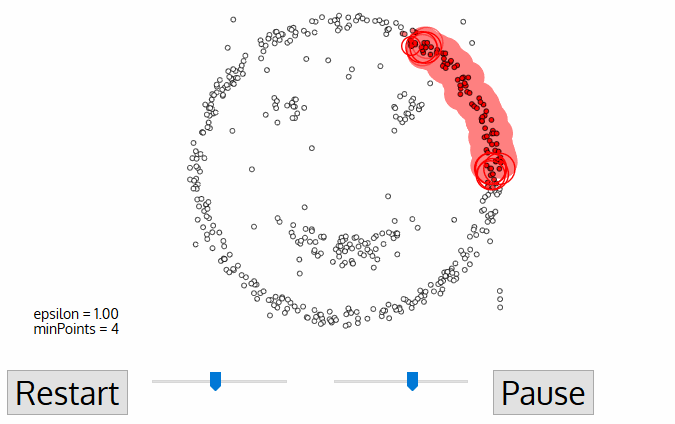

# 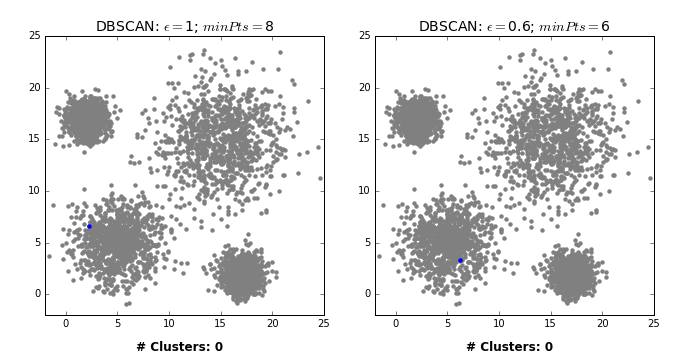

# Data Collection - Moons Dataset

In [2]:
from sklearn.datasets import make_moons
x,y=make_moons(100)

In [3]:
y

array([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0])

In [4]:
import pandas as pd
data=pd.DataFrame(x)
data

,0,1
0,-0.222521,9.749279e-01
1,-1.000000,1.224647e-16
2,1.838088,-4.553490e-02
3,-0.404783,9.144126e-01
4,1.284528,-4.586679e-01
...,...,...
95,-0.838088,5.455349e-01
96,0.949056,3.151082e-01
97,0.238554,-1.482284e-01
98,1.761446,-1.482284e-01


In [6]:
data.columns=["f1","f2"]
data

,f1,f2
0,-0.222521,9.749279e-01
1,-1.000000,1.224647e-16
2,1.838088,-4.553490e-02
3,-0.404783,9.144126e-01
4,1.284528,-4.586679e-01
...,...,...
95,-0.838088,5.455349e-01
96,0.949056,3.151082e-01
97,0.238554,-1.482284e-01
98,1.761446,-1.482284e-01


In [7]:
data["class"]=y
data

,f1,f2,class
0,-0.222521,9.749279e-01,0
1,-1.000000,1.224647e-16,0
2,1.838088,-4.553490e-02,1
3,-0.404783,9.144126e-01,0
4,1.284528,-4.586679e-01,1
...,...,...,...
95,-0.838088,5.455349e-01,0
96,0.949056,3.151082e-01,0
97,0.238554,-1.482284e-01,1
98,1.761446,-1.482284e-01,1


In [9]:
data.head()

,f1,f2,class
0,-0.222521,9.749279e-01,0
1,-1.000000,1.224647e-16,0
2,1.838088,-4.553490e-02,1
3,-0.404783,9.144126e-01,0
4,1.284528,-4.586679e-01,1


C:\Users\Smile\AppData\Local\Temp\ipykernel_348\146973595.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data["f1"],data["f2"],cmap=plt.cm.Accent)


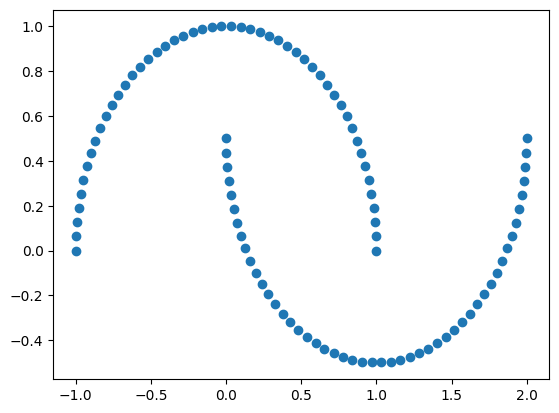

In [12]:
from matplotlib import pyplot as plt
plt.scatter(data["f1"],data["f2"],cmap=plt.cm.Accent)
plt.show()

### The above behaviour is the Original pattern in the Dataset.

#### Let's apply all 3 Clustering techniques and find out which is BEST.

### ===================================================

# 1. Using Kmeans for moon data

In [16]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=2, max_iter=600, algorithm = 'auto')

In [17]:
model.fit(data.iloc[:,:2])

InvalidParameterError: The 'algorithm' parameter of KMeans must be a str among {'lloyd', 'elkan'}. Got 'auto' instead.

In [13]:
claas_pr=model.predict(data.iloc[:,:2])

In [14]:
data["class_pr"]=claas_pr

In [15]:
data.head()

,f1,f2,class,class_pr
0,1.926917,0.124733,1,0
1,1.159600,-0.487182,1,0
2,0.997945,0.064070,0,0
3,1.623490,-0.281831,1,0
4,1.222521,-0.474928,1,0


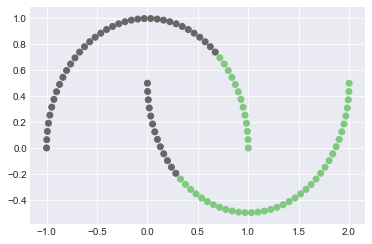

In [76]:
plt.scatter(data["f1"],data["f2"],c=data["class_pr"],cmap=plt.cm.Accent)

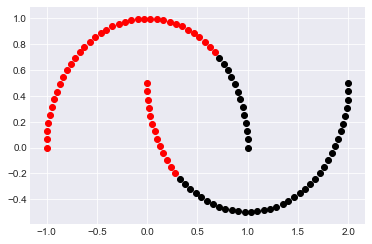

In [285]:
plt.scatter(data[data["class_pr"]==1].iloc[:,0],data[data["class_pr"]==1].iloc[:,1],color="red")
plt.scatter(data[data["class_pr"]==0].iloc[:,0],data[data["class_pr"]==0].iloc[:,1],color="black")

### Takeaway: Not accurate.

### ===================================================

# 2. Using Hierarchical Clustering

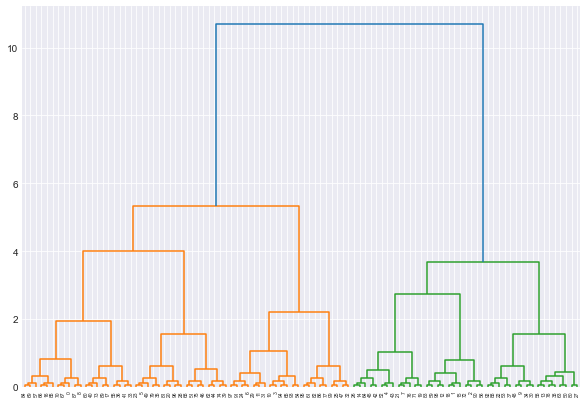

In [26]:
linked = linkage(data.iloc[:,:2], 'ward')

plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=True)
plt.show()

In [27]:
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage="single")
claas_pr= cluster.fit_predict(data.iloc[:,:2])

In [28]:
data["class_pr"]=claas_pr

In [31]:
data.head(20)

,f1,f2,class,class_pr
0,0.032705,0.246345,1,0
1,0.991790,0.127877,0,1
2,0.801414,0.598111,0,1
3,-0.949056,0.315108,0,1
4,0.777479,-0.474928,1,0
5,0.096023,0.995379,0,1
6,-0.761446,0.648228,0,1
7,1.404783,-0.414413,1,0
8,0.002055,0.435930,1,0
9,1.623490,-0.281831,1,0


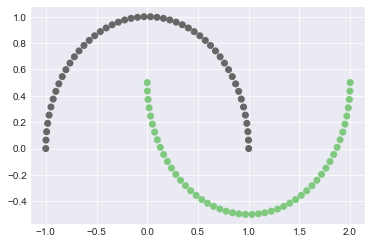

In [32]:
plt.scatter(data["f1"],data["f2"],c=data["class_pr"],cmap=plt.cm.Accent)

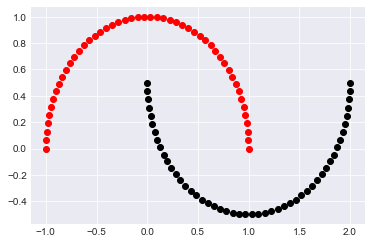

In [33]:
plt.scatter(data[data["class_pr"]==1].iloc[:,0],data[data["class_pr"]==1].iloc[:,1],color="red")
plt.scatter(data[data["class_pr"]==0].iloc[:,0],data[data["class_pr"]==0].iloc[:,1],color="black")

### Takeaway: Correct Clustering. Well Done

### ===================================================

# 3. Applying DBScan

In [2]:
from sklearn.cluster import DBSCAN 

In [72]:
min_samples=2 #n

In [40]:
dbs=DBSCAN(min_samples=2,eps=0.2)
claas_pr=dbs.fit_predict(data.iloc[:,:2])

In [41]:
claas_pr

array([0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

In [42]:
data["class_pr"]=claas_pr
data

,f1,f2,class,class_pr
0,0.032705,0.246345,1,0
1,0.991790,0.127877,0,1
2,0.801414,0.598111,0,1
3,-0.949056,0.315108,0,1
4,0.777479,-0.474928,1,0
...,...,...,...,...
95,-0.284528,0.958668,0,1
96,0.159600,0.987182,0,1
97,-0.801414,0.598111,0,1
98,0.981559,0.191159,0,1


Text(0, 0.5, 'f2')

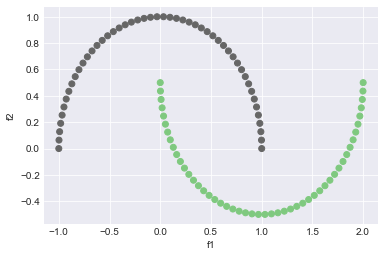

In [43]:
import matplotlib.pyplot as plt
plt.scatter(data["f1"],data["f2"],c=data["class_pr"],cmap=plt.cm.Accent)
plt.xlabel("f1")
plt.ylabel("f2")

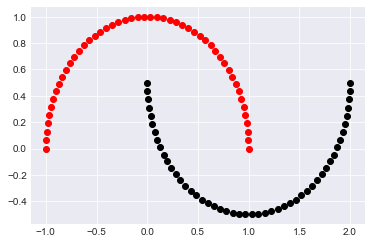

In [44]:
plt.scatter(data[data["class_pr"]==1].iloc[:,0],data[data["class_pr"]==1].iloc[:,1],color="red")
plt.scatter(data[data["class_pr"]==0].iloc[:,0],data[data["class_pr"]==0].iloc[:,1],color="black")

### Takeaway: Correct Clustering. Well Done

### BUT, not finding the much difference between Hierarchical Vs DBScan.

### ===================================================

# logisticdrawback.csv

In [45]:
data=pd.read_csv("logisticdrawback.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'logisticdrawback.csv'

In [92]:
data.head()

,f1,f2,class
0,-1.335474,1.376236,1
1,-1.918388,-0.528479,1
2,0.015120,0.020986,1
3,-0.131351,0.119043,1
4,0.794606,1.421984,1


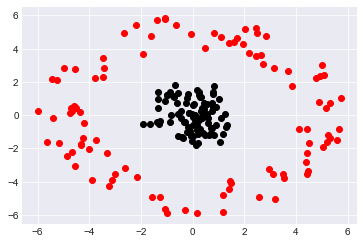

In [93]:
plt.scatter(data[data["class"]==1].iloc[:,0],data[data["class"]==1].iloc[:,1],color="black")
plt.scatter(data[data["class"]==2].iloc[:,0],data[data["class"]==2].iloc[:,1],color="red")
plt.show() 

In [94]:
data=data.iloc[:200,:2].copy()

### The above behaviour is the Original pattern in the Dataset.

#### Now, Let's again apply all 3 Clustering techniques and find out which is BEST for this Data pattern.

### ===================================================

# 1. Using KMeans

In [467]:
model = KMeans(n_clusters=2, max_iter=600, algorithm = 'auto')
class_pr=model.fit_predict(data.iloc[:,:2])

In [468]:
data["class_pr"]=class_pr

In [469]:
data.head()

,f1,f2,class_pr
0,-1.335474,1.376236,1
1,-1.918388,-0.528479,0
2,0.015120,0.020986,1
3,-0.131351,0.119043,1
4,0.794606,1.421984,1


In [470]:
class_pr

array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0,
       1, 1], dtype=int32)

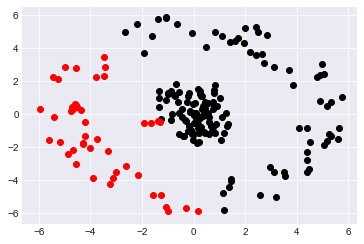

In [471]:
plt.scatter(data[data["class_pr"]==1].iloc[:,0],data[data["class_pr"]==1].iloc[:,1],color="black")
plt.scatter(data[data["class_pr"]==0].iloc[:,0],data[data["class_pr"]==0].iloc[:,1],color="red")
plt.scatter(data[data["class_pr"]==2].iloc[:,0],data[data["class_pr"]==2].iloc[:,1],color="blue")
plt.show()

# 2. Using Hierarchical Clustering

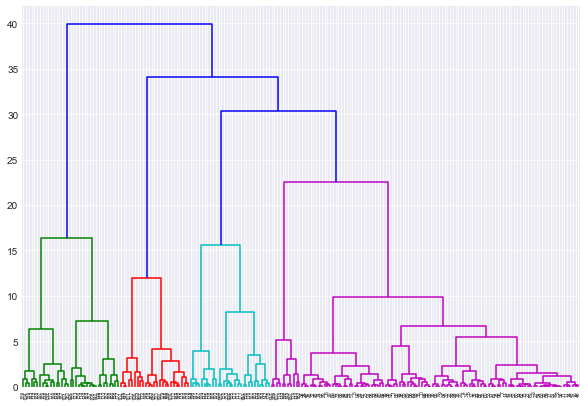

In [95]:
linked = linkage(data.iloc[:,:2], 'ward')

plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=True)
plt.show()

In [103]:
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
class_pr=cluster.fit_predict(data.iloc[:,:2])

In [104]:
data["class_pr"]=class_pr

In [105]:
data.head()

,f1,f2,class_pr
0,-1.335474,1.376236,0
1,-1.918388,-0.528479,0
2,0.015120,0.020986,0
3,-0.131351,0.119043,0
4,0.794606,1.421984,0


In [106]:
class_pr


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0])

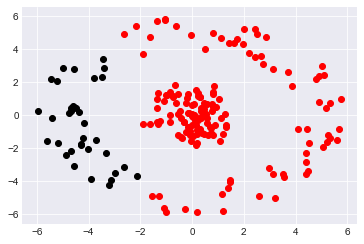

In [107]:
plt.scatter(data[data["class_pr"]==1].iloc[:,0],data[data["class_pr"]==1].iloc[:,1],color="black")
plt.scatter(data[data["class_pr"]==0].iloc[:,0],data[data["class_pr"]==0].iloc[:,1],color="red")
plt.scatter(data[data["class_pr"]==2].iloc[:,0],data[data["class_pr"]==2].iloc[:,1],color="blue")
plt.show()

# 3. Applying dbscan

In [480]:

dbs=DBSCAN(min_samples=2,eps=2)
class_pr=dbs.fit_predict(data.iloc[:200,:2])

In [481]:
data["class_pr"]=class_pr

In [482]:
set(class_pr)

{0, 1}

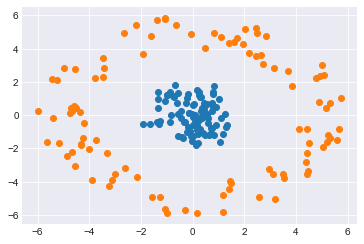

In [483]:
for i in set(class_pr):
    plt.scatter(data[data["class_pr"]==i].iloc[:,0],data[data["class_pr"]==i].iloc[:,1])

# THE BEST !!!!!!!!!!!!!!!!

### ===================================================

# Now, your task Review....
#### Finding the optimal number of clusters

In [15]:
import seaborn as sns
iris=sns.load_dataset("iris") 

In [16]:
iris

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [17]:
iris.species.unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [164]:
nc=[2,3,4,5,6,7,8,9]
iner=[]    
for i in nc:
    km=KMeans(i)
    km.fit(iris.iloc[:,:4])
    iner.append(km.inertia_)

In [165]:
#iner

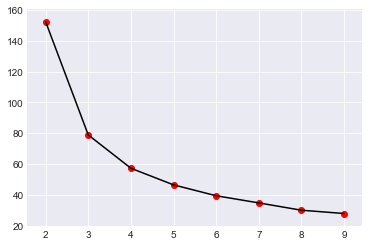

In [166]:
plt.plot(nc,iner,color="black")
plt.scatter(nc,iner,color="red")
plt.show()

# silhouette_score 

In [18]:
from sklearn.metrics import silhouette_score as sil

In [19]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [21]:
from sklearn.cluster import KMeans
nc=[2,3,4,5,6,7,8,9]
iner=[]    
for i in nc:
    km=KMeans(i)
    y=km.fit_predict(iris.iloc[:,:4])
    iner.append(sil(iris.iloc[:,:4],y))

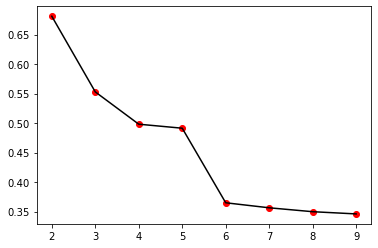

In [22]:
plt.plot(nc,iner,color="black")
plt.scatter(nc,iner,color="red")
plt.show()

# calinski_harabaz_score

In [492]:
from sklearn.metrics import calinski_harabaz_score as chs

In [493]:
nc=[2,3,4,5,6,7,8,9]
iner=[]    
for i in nc:
    km=KMeans(i)
    y=km.fit_predict(iris.iloc[:,:4])
    iner.append(chs(iris.iloc[:,:4],y))

/Users/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:85: DeprecationWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=DeprecationWarning)
/Users/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:85: DeprecationWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=DeprecationWarning)
/Users/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:85: DeprecationWarning: Function calinski_harabaz_score is deprecated; Function 'calinski_harabaz_score' has been renamed to 'calinski_harabasz_score' and will be removed in version 0.23.
  warnings.warn(msg, category=DeprecationWarning)
/Users/anaconda3/lib/python3.7/site-packages/sklearn/utils/depre

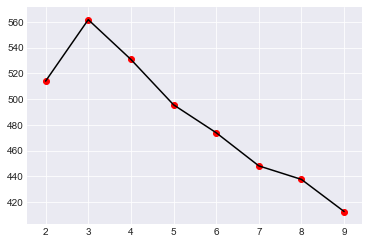

In [494]:
plt.plot(nc,iner,color="black")
plt.scatter(nc,iner,color="red")
plt.show()

In [495]:
from sklearn.cluster import SpectralClustering
import numpy as np
clustering = SpectralClustering(n_clusters=3,
        assign_labels="discretize").fit(data.iloc[:,:2])
clustering.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 2, 2, 1, 2,
       2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2,
       2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1,
       2, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1,
       2, 2])